In [1]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format='retina'

# load global efficiency

In [2]:
hcp_globalEff_data = r'E:\gregn\data\HCP\HCP_globalEfficiency_2scan.h5'
hcp_globalEff = pd.read_hdf(hcp_globalEff_data, 'hcp_globalEff')
hcp_globalEff = hcp_globalEff.set_index(['Subject'])
print('global efficiency\nrows:  {}\ncols:    {}'.format(hcp_globalEff.shape[0], hcp_globalEff.shape[1]))
print('\ndata type value counts:')
print(hcp_globalEff.dtypes.value_counts())

global efficiency
rows:  1082
cols:    90

data type value counts:
float64    90
dtype: int64


# load restricted data

In [3]:
hcp_restricted_data = r'E:\gregn\data\HCP\HCP_RESTRICTED.h5'
hcp_restricted = pd.read_hdf(hcp_restricted_data, 'hcp_restricted')
hcp_restricted = hcp_restricted.set_index(['Subject'])
print('HCP RESTRICTED\nrows: {}\ncols:  {}'.format(hcp_restricted.shape[0], hcp_restricted.shape[1]))
print('\ndata type value counts:')
print(hcp_restricted.dtypes.value_counts())

HCP RESTRICTED
rows: 1206
cols:  200

data type value counts:
float64    177
bool         9
object       8
int64        6
dtype: int64


# join data

In [4]:
hcp = hcp_globalEff.join(hcp_restricted[['Family_ID', 'SSAGA_Mj_Times_Used']])
print('HCP \nrows: {}\ncols:   {}'.format(hcp.shape[0], hcp.shape[1]))
print('\ndata type value counts:')
print(hcp.dtypes.value_counts())

HCP 
rows: 1082
cols:   92

data type value counts:
float64    91
object      1
dtype: int64


# y target variable

In [5]:
hcp = hcp.dropna(subset=['SSAGA_Mj_Times_Used'])

y = hcp['SSAGA_Mj_Times_Used'].values
y = np.where(y==1, 0, y)
y = np.where(y==2, 0, y)
y = np.where(y==3, 1, y)
y = np.where(y==4, 1, y)
y = np.where(y==5, 1, y)

unique, counts = np.unique(y, return_counts=True)

print('10x binary classification counts')
print('[0] used less than or equal to 10x:    ', counts[0])
print('[1] used more than 10x:                ', counts[1])

print('\n\noriginal marijuana times used class counts:\n')
print(hcp['SSAGA_Mj_Times_Used'].value_counts())

10x binary classification counts
[0] used less than or equal to 10x:     791
[1] used more than 10x:                 289


original marijuana times used class counts:

0.0    489
1.0    221
3.0    125
5.0     96
2.0     81
4.0     68
Name: SSAGA_Mj_Times_Used, dtype: int64


# X features

In [6]:
X = hcp
X = X.drop(['SSAGA_Mj_Times_Used', 'Family_ID'], axis=1)
print('number of features:', len(X.columns))
list(X.columns)

number of features: 90


['Cingulum_Ant_R',
 'Cingulum_Mid_L',
 'Cingulum_Mid_R',
 'Cingulum_Post_L',
 'Cingulum_Post_R',
 'Cuneus_L',
 'Cuneus_R',
 'Frontal_Inf_Oper_L',
 'Frontal_Inf_Oper_R',
 'Frontal_Inf_Orb_L',
 'Amygdala_L',
 'Frontal_Inf_Orb_R',
 'Frontal_Inf_Tri_L',
 'Frontal_Inf_Tri_R',
 'Frontal_Mid_Orb_L',
 'Frontal_Mid_Orb_R',
 'Frontal_Mid_L',
 'Frontal_Mid_Orb_L.1',
 'Frontal_Mid_Orb_R.1',
 'Frontal_Mid_R',
 'Frontal_Sup_L',
 'Amygdala_R',
 'Frontal_Sup_Medial_L',
 'Frontal_Sup_Medial_R',
 'Frontal_Sup_Orb_L',
 'Frontal_Sup_Orb_R',
 'Frontal_Sup_R',
 'Fusiform_L',
 'Fusiform_R',
 'Heschl_L',
 'Heschl_R',
 'Hippocampus_L',
 'Angular_L',
 'Hippocampus_R',
 'Insula_L',
 'Insula_R',
 'Lingual_L',
 'Lingual_R',
 'Occipital_Inf_L',
 'Occipital_Inf_R',
 'Occipital_Mid_L',
 'Occipital_Mid_R',
 'Occipital_Sup_L',
 'Angular_R',
 'Occipital_Sup_R',
 'Olfactory_L',
 'Olfactory_R',
 'Pallidum_L',
 'Pallidum_R',
 'ParaHippocampal_L',
 'ParaHippocampal_R',
 'Paracentral_Lobule_L',
 'Paracentral_Lobule_R',
 'Par

# family groups 

In [7]:
from collections import defaultdict

d = defaultdict(lambda: len(d))
family_groups = [d[x] for x in hcp['Family_ID']]

In [8]:
family_groups = np.array(family_groups)
family_groups

array([  0,   1,   2, ..., 129,   8, 389])

# nested cross-validation

In [9]:
import xgboost
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, GroupKFold
from time import time
from datetime import timedelta
warnings.filterwarnings('ignore')

start_time = time()


model = XGBClassifier(
    tree_method = 'auto',
    objective = 'binary:logistic',
    early_stopping_rounds = 30, 
    n_estimators = 10000,
    nthread = 6,
    random_state = 42
)


params = {
    'learning_rate': [0.01, 0.02, 0.05, 0.1, 0.2],
    'max_depth': [4, 6, 8, 10, 12],
    'subsample': [0.6, 0.8, 1]
}


inner_cv = GroupKFold(n_splits=5)
inner_cv = inner_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
outer_cv = GroupKFold(n_splits=5)
outer_cv = outer_cv.get_n_splits(X, y, groups=family_groups.tolist())
    
    
# non_nested parameter search and scoring
gs = GridSearchCV(
    estimator=model, 
    param_grid=params, 
    scoring='roc_auc', 
    cv=inner_cv,
    return_train_score=True,
    verbose=1
)
gs.fit(X, y)

# nested cv with parameter optimization
nested_score = cross_val_score(
    gs,
    X=X, 
    y=y, 
    scoring='roc_auc', 
    cv=outer_cv,
)
print('-------------------------------------------------------------------------------')
print('\nruntime:', str(timedelta(seconds=time()-start_time)))
print('scores:', nested_score)
print('average score:', nested_score.mean())
print('std:', nested_score.std())
print('\nbest estimator:\n\n', gs.best_estimator_)

Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 76.7min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 68.3min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 74.7min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 76.1min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 78.6min finished


Fitting 5 folds for each of 75 candidates, totalling 375 fits


[Parallel(n_jobs=1)]: Done 375 out of 375 | elapsed: 68.9min finished


-------------------------------------------------------------------------------

runtime: 7:24:31.352446
scores: [0.59835177 0.5476866  0.57267569 0.53622872 0.58572063]
average score: 0.5681326812992885
std: 0.02314766929591758

best estimator:

 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, early_stopping_rounds=30, gamma=0,
       learning_rate=0.1, max_delta_step=0, max_depth=12,
       min_child_weight=1, missing=None, n_estimators=10000, n_jobs=1,
       nthread=6, objective='binary:logistic', random_state=42,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1, tree_method='auto')


In [10]:
from sklearn.externals import joblib
joblib.dump(gs, 'hcp_times_binary10x_gridsearch_globalEfficiency_2scan_brain.pkl')
joblib.dump(nested_score, 'hcp_times_binary10x_nested_score_globalEfficiency_2scan_brain.pkl')

['hcp_times_binary10x_nested_score_globalEfficiency_2scan_brain.pkl']

# first tree

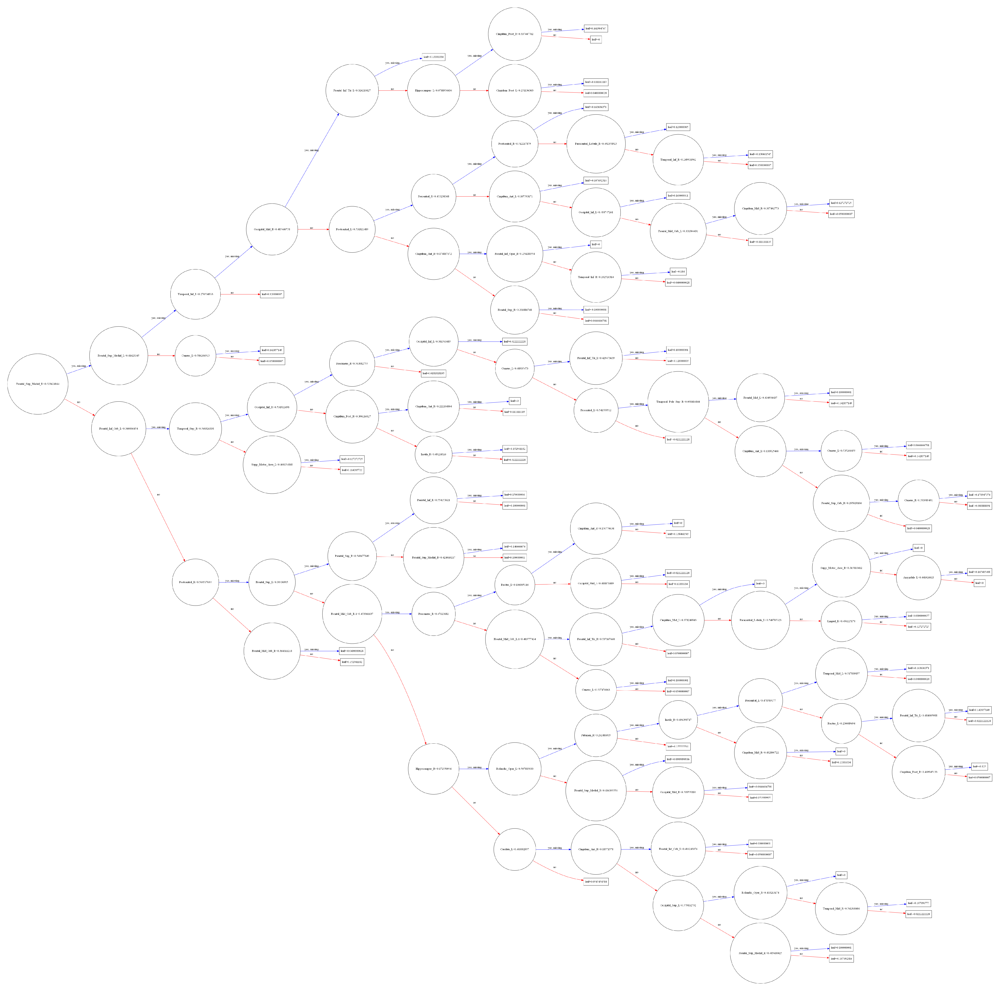

In [11]:
from xgboost import plot_tree
from matplotlib.pylab import rcParams
plt.style.use('default')
rcParams['figure.dpi'] = 200

plot_tree(gs.best_estimator_, num_trees=0, rankdir='LR')
fig = plt.gcf()
fig.set_size_inches(26.5,19)
plt.show()

# SHAP

In [12]:
import shap
shap.initjs()

In [13]:
explainer = shap.TreeExplainer(gs.best_estimator_)
shap_values = explainer.shap_values(X)

X_display, y_display = X, y

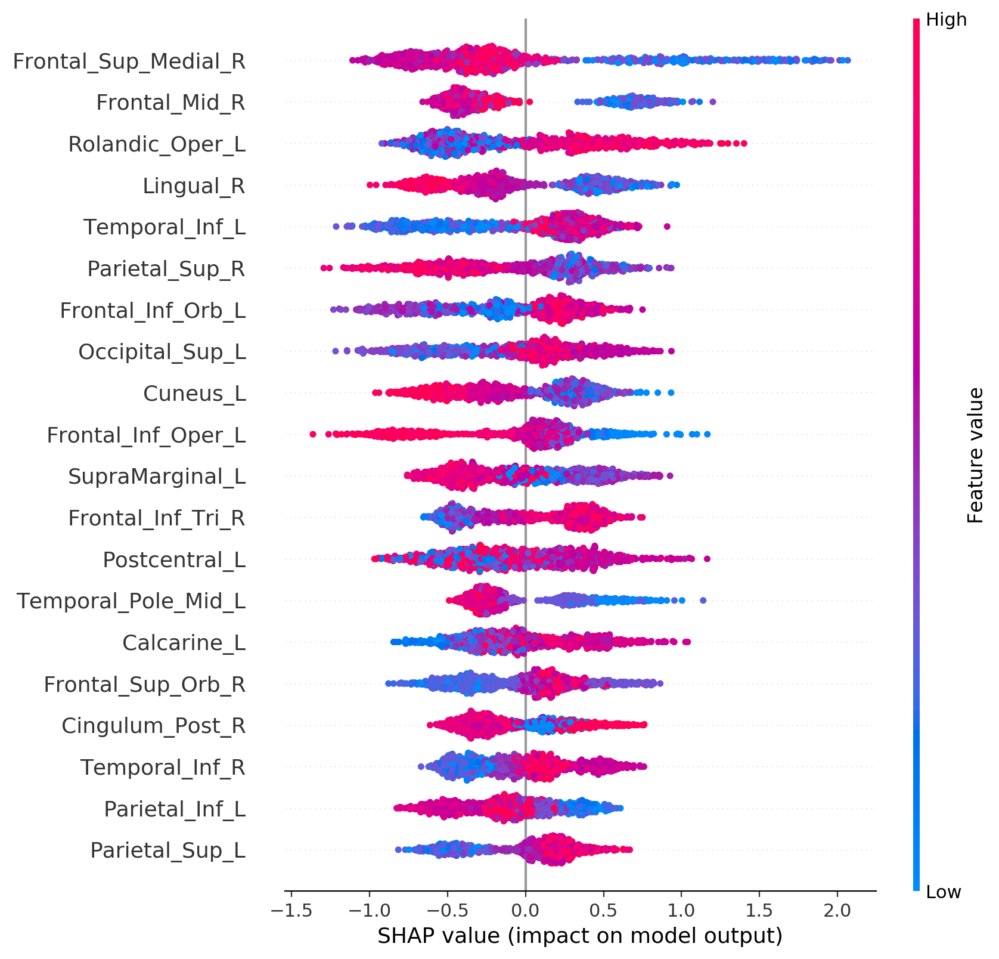

In [14]:
rcParams['figure.dpi'] = 120
plt.style.use('default')

shap.summary_plot(shap_values, X_display)

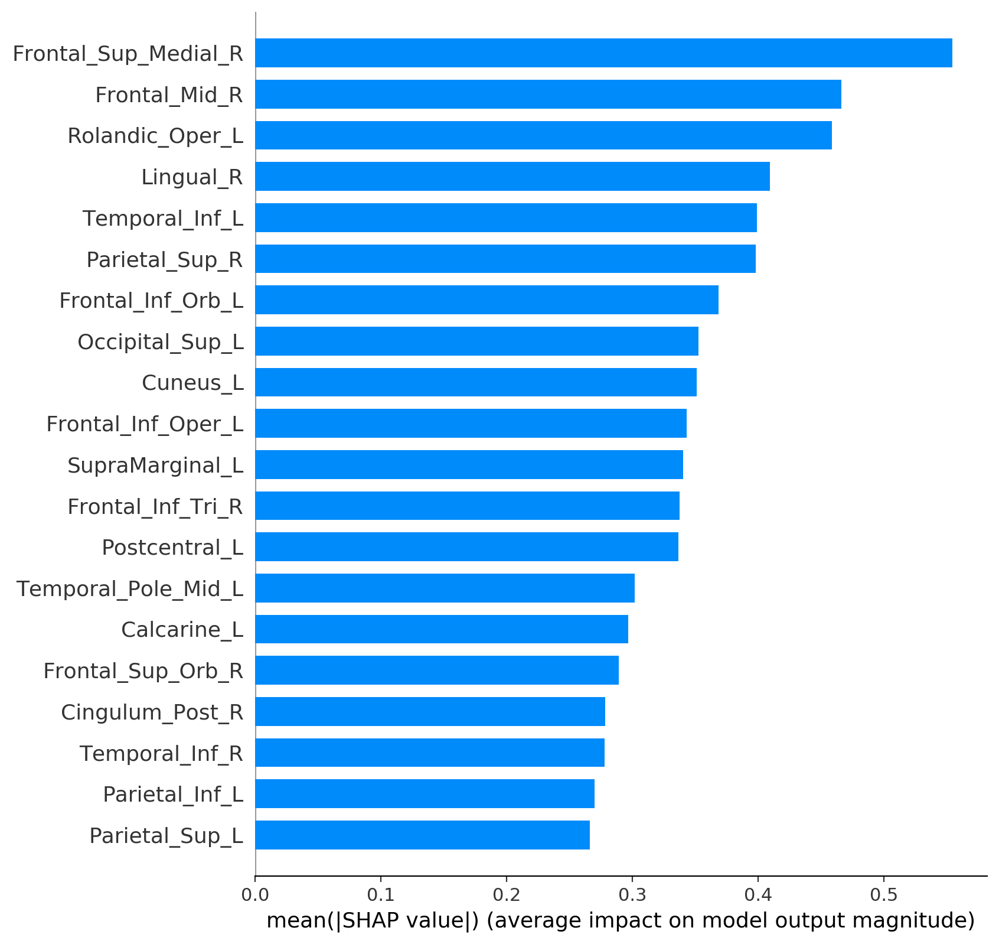

In [15]:
shap.summary_plot(shap_values, X_display, plot_type='bar')

# SHAP dependence plots
# top 20

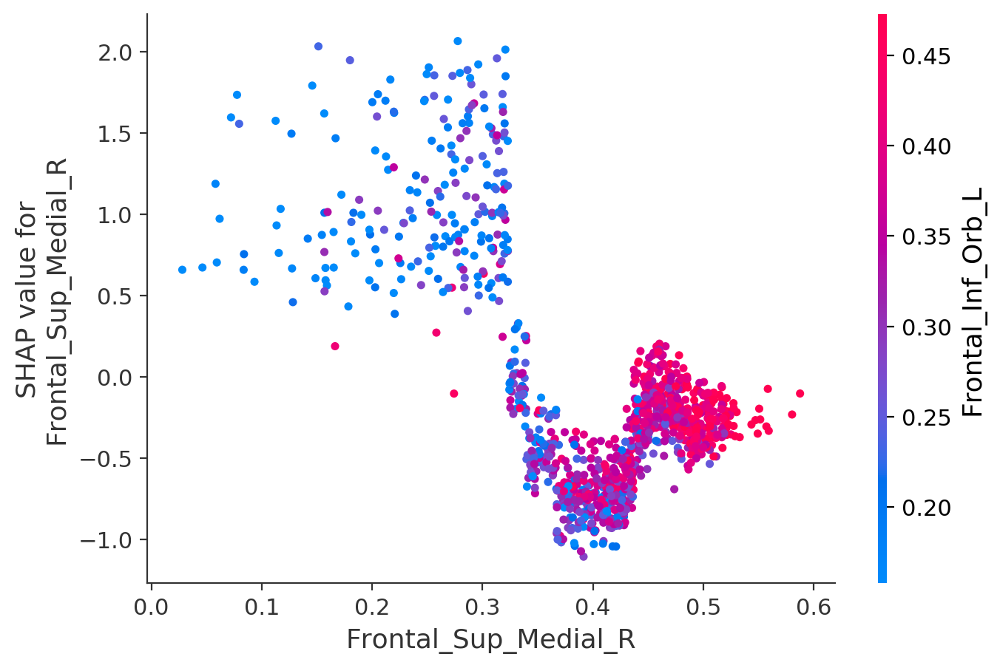

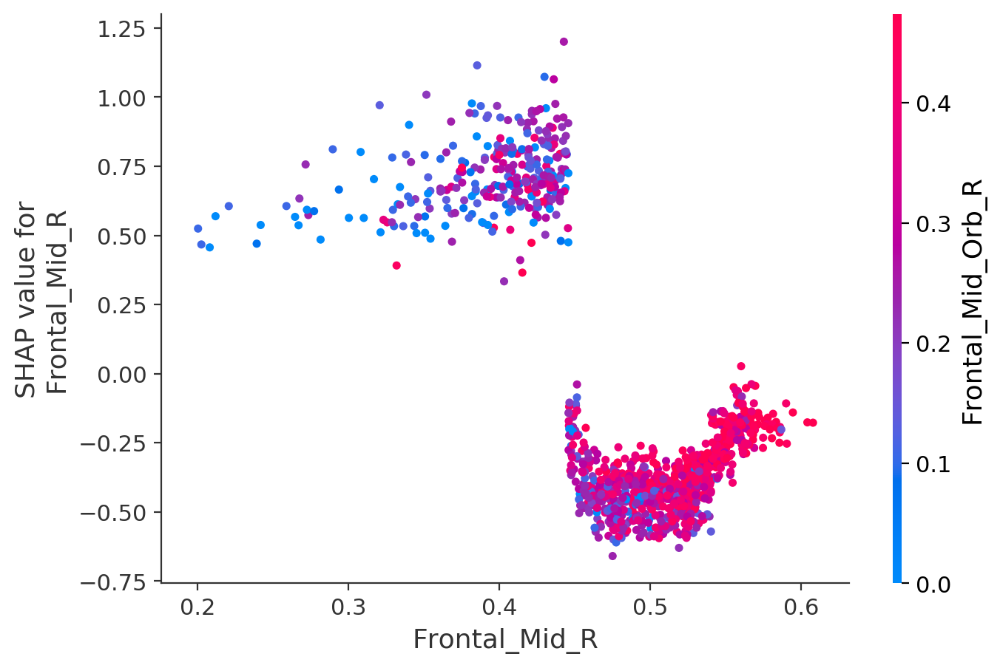

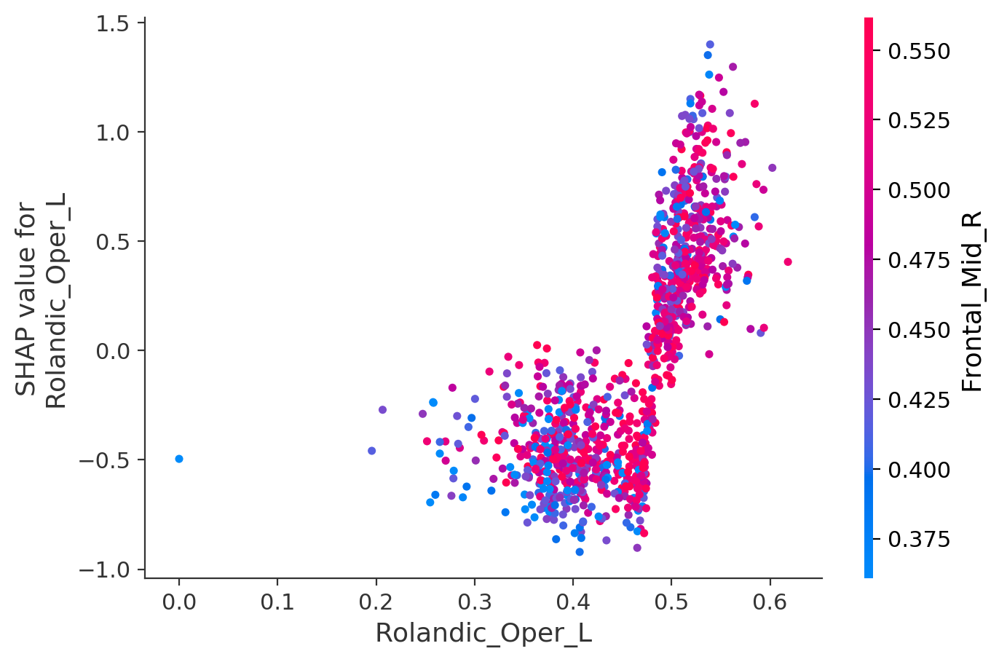

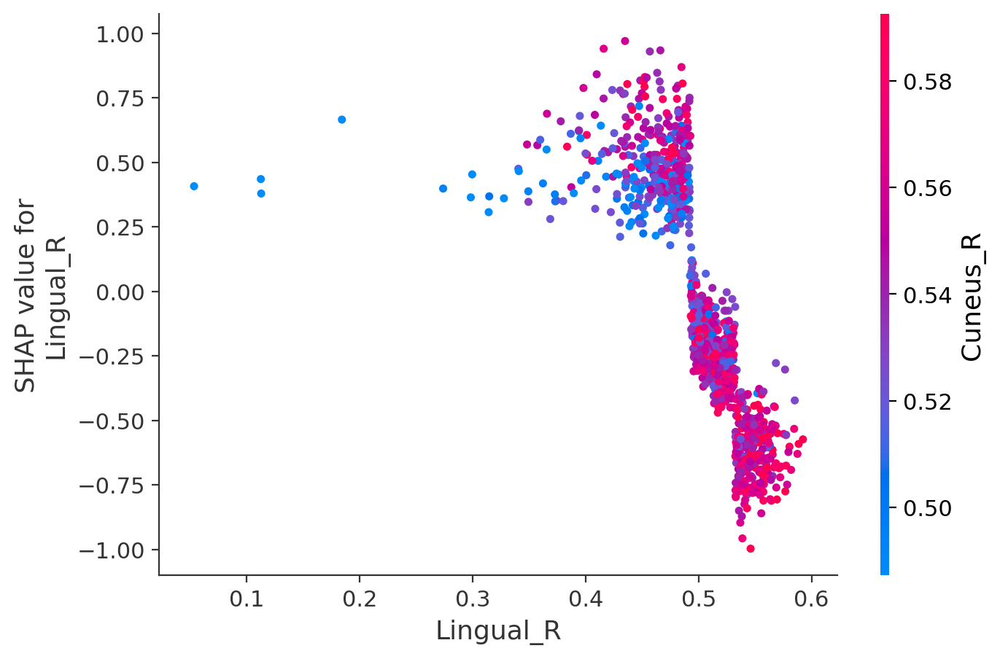

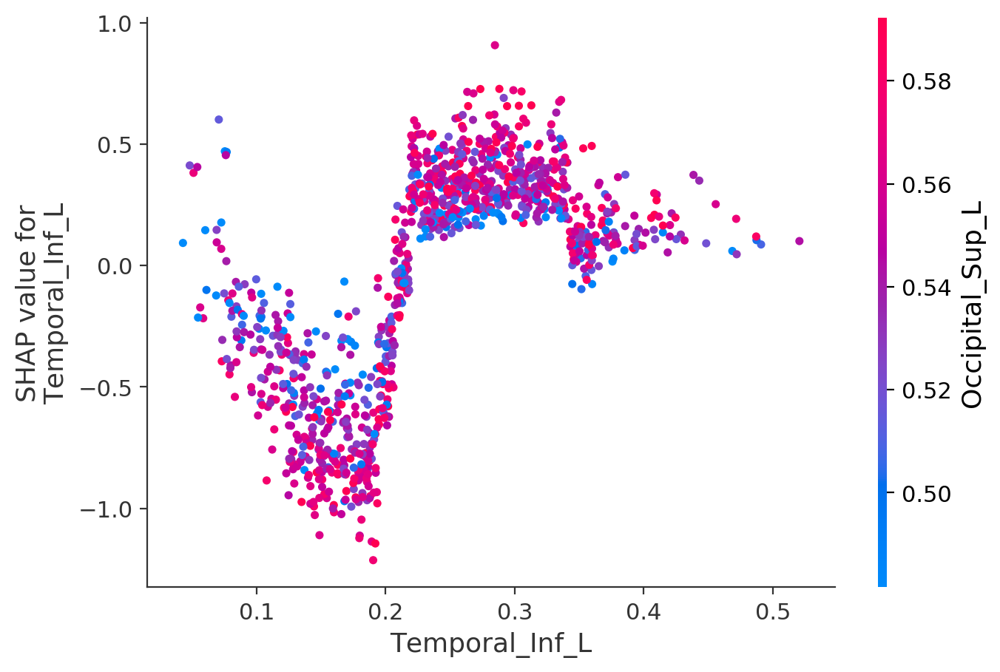

...

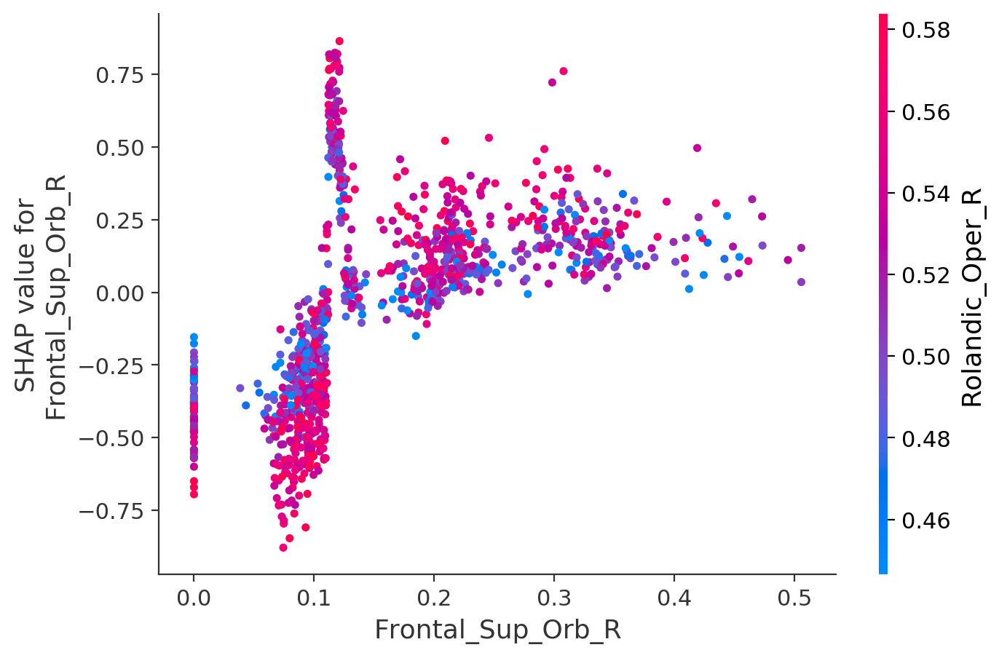

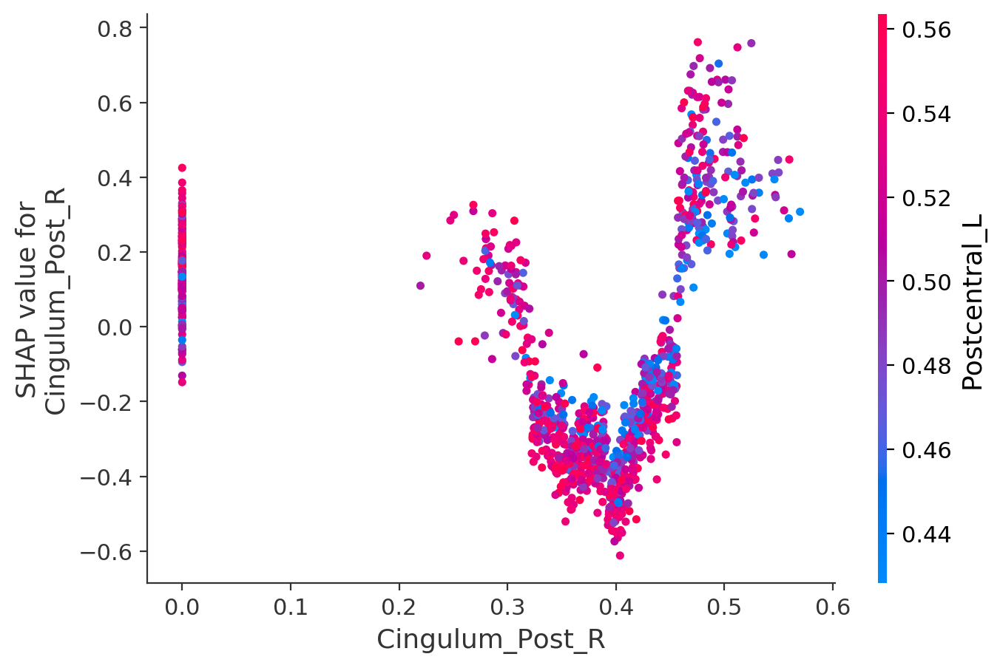

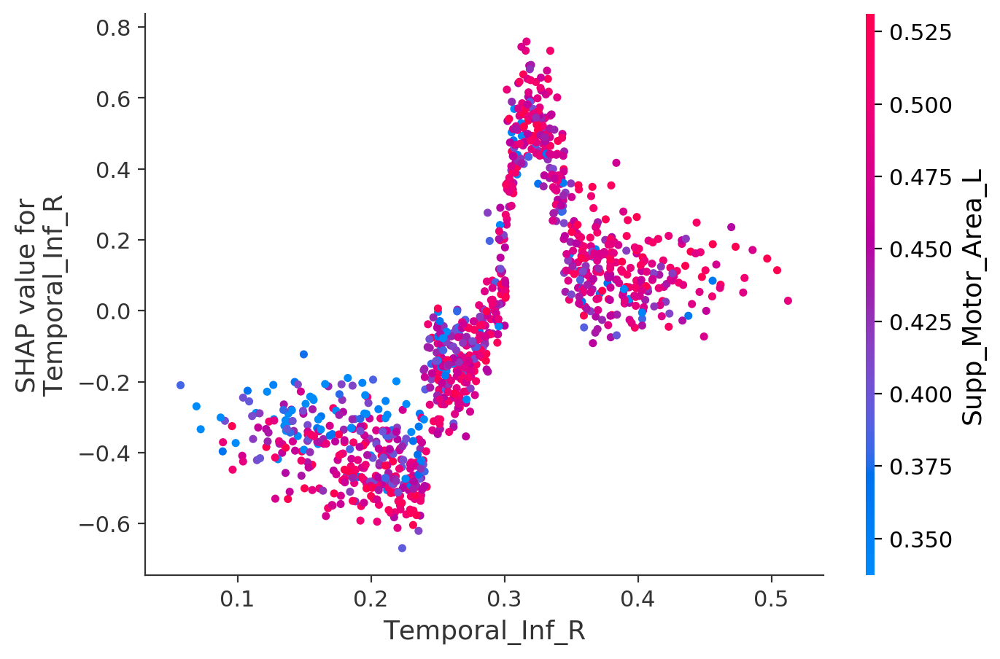

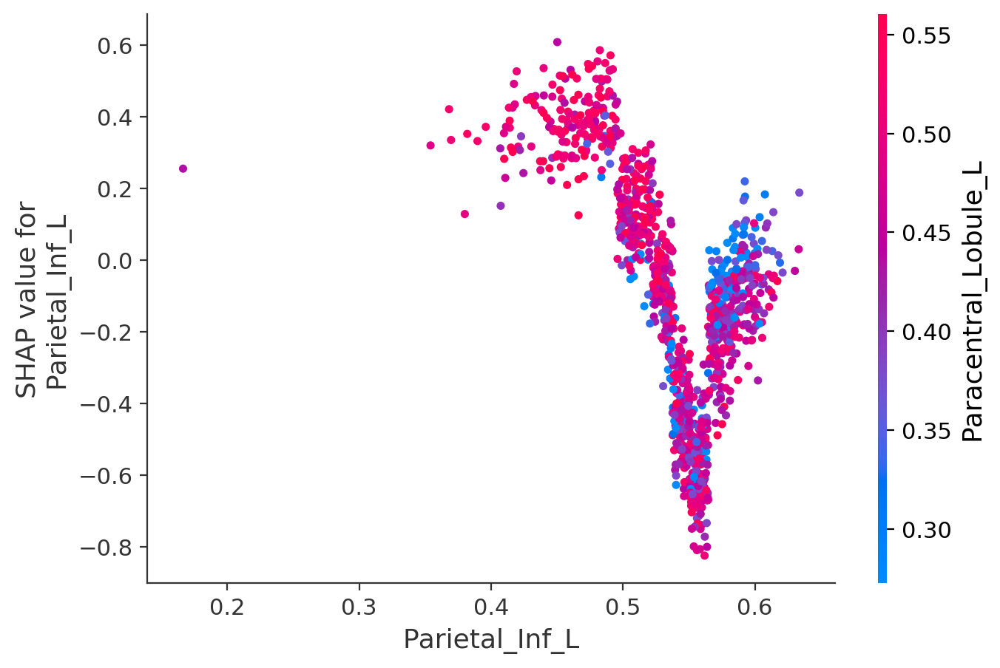

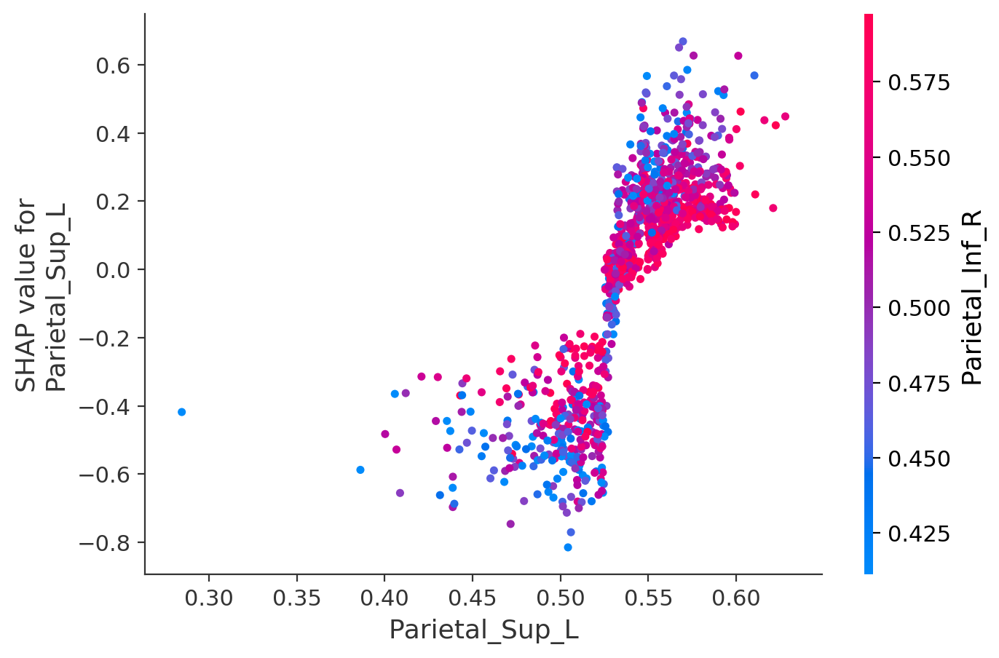

In [16]:
top_inds = np.argsort(-np.sum(np.abs(shap_values), 0))
for i in range(20):
    shap.dependence_plot(
        top_inds[i], 
        shap_values, 
        X, 
        display_features=X_display
    )

# SHAP interaction values
# top 20

In [17]:
shap_interaction_values = shap.TreeExplainer(gs.best_estimator_).shap_interaction_values(X)
joblib.dump(shap_interaction_values, 'hcp_times_binary10x_shap_interaction_values_globalEfficiency_2scan_brain.pkl')

['hcp_times_binary10x_shap_interaction_values_globalEfficiency_2scan_brain.pkl']

# SHAP main effect value plots 
# top 20

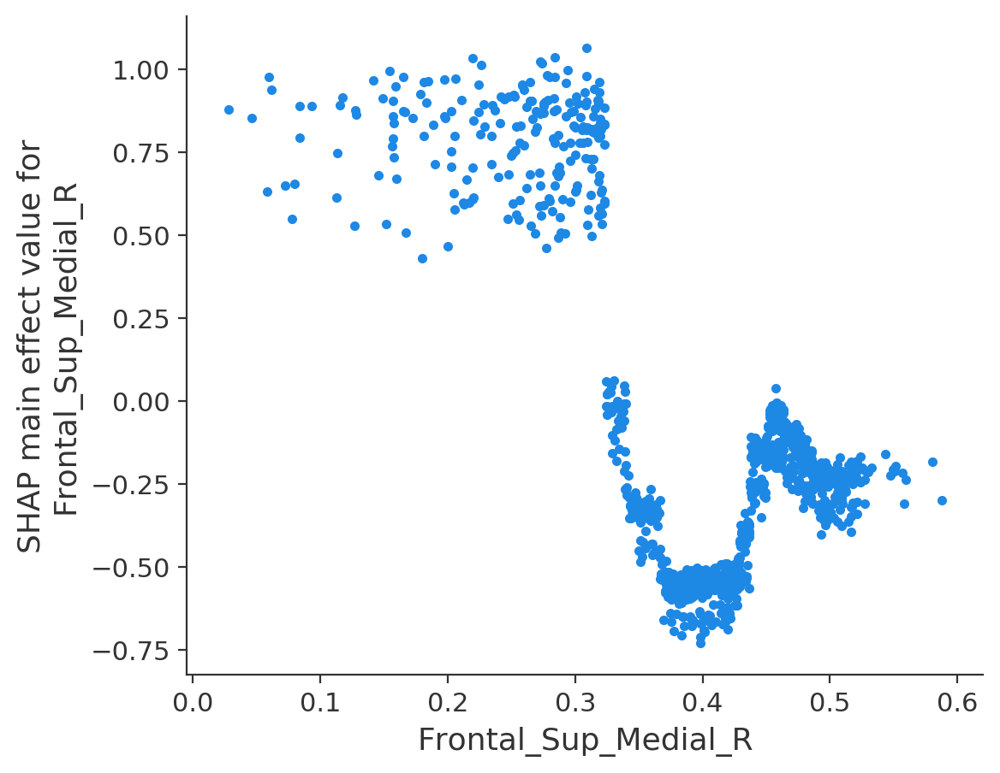

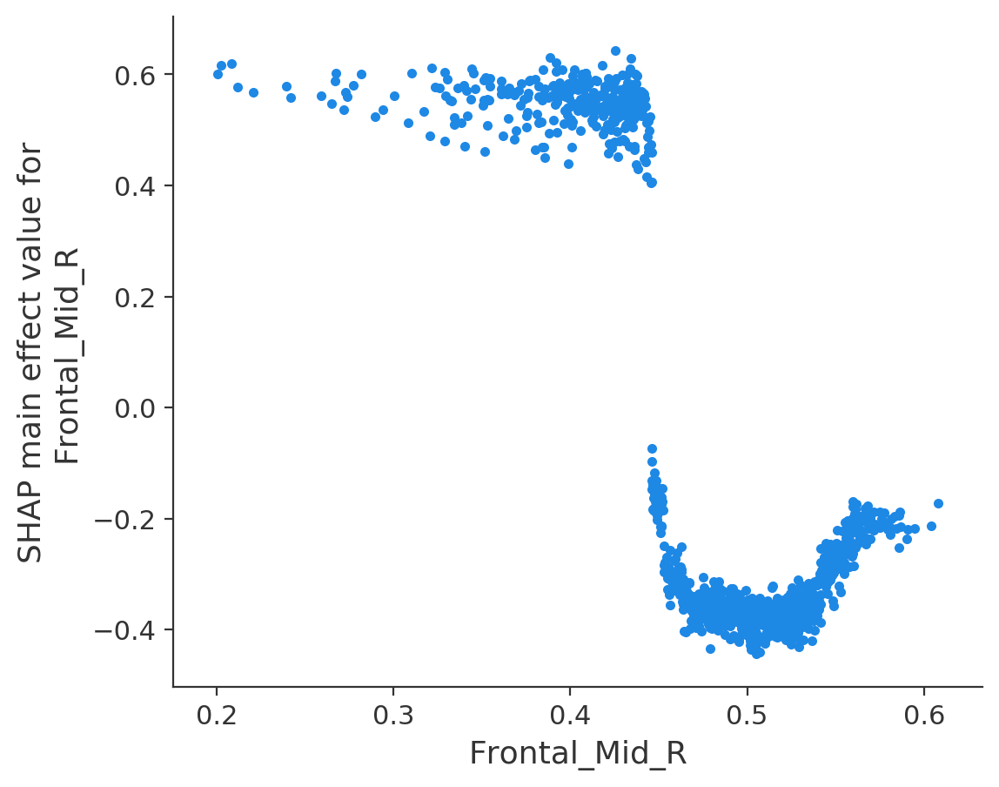

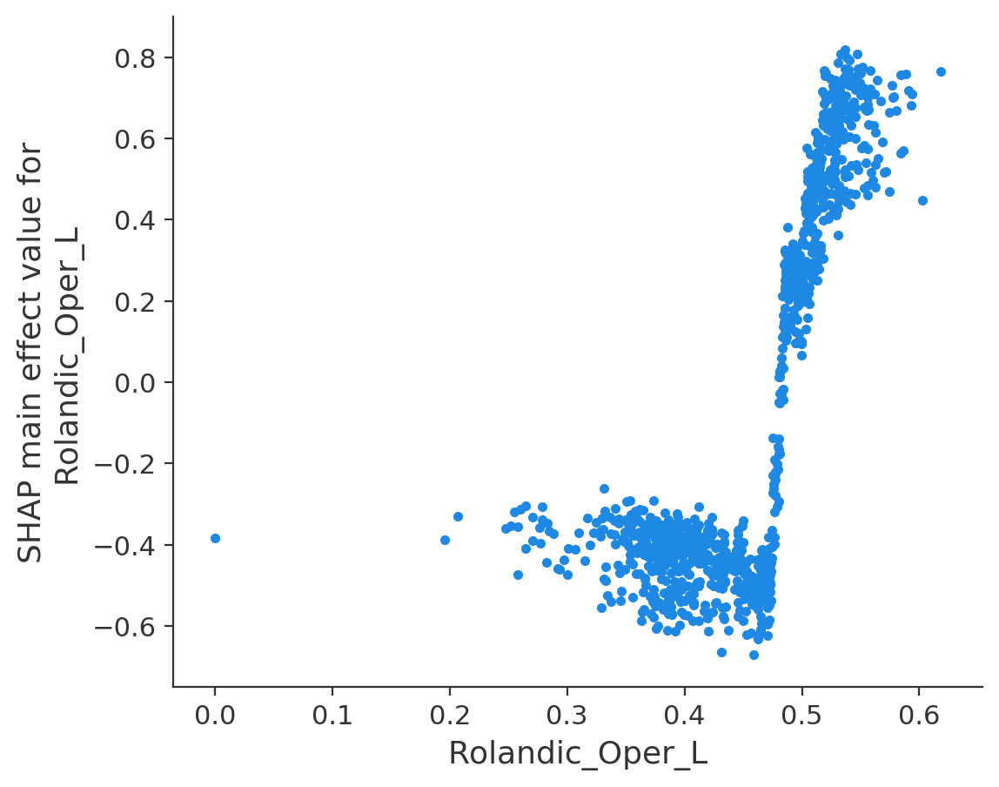

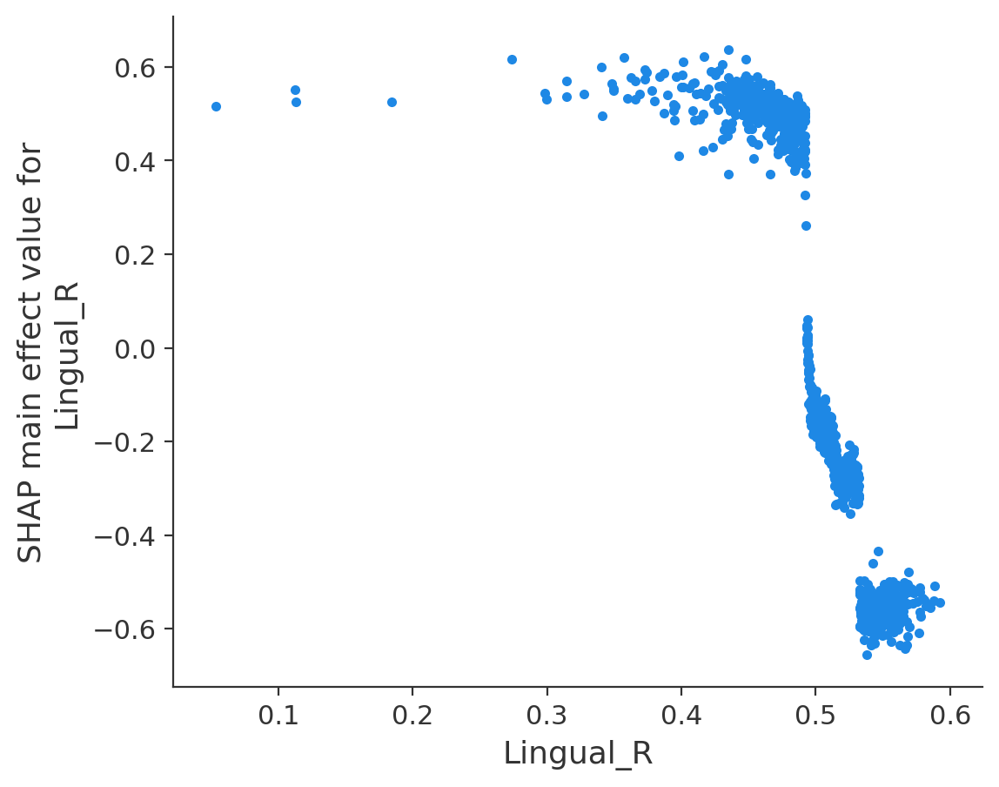

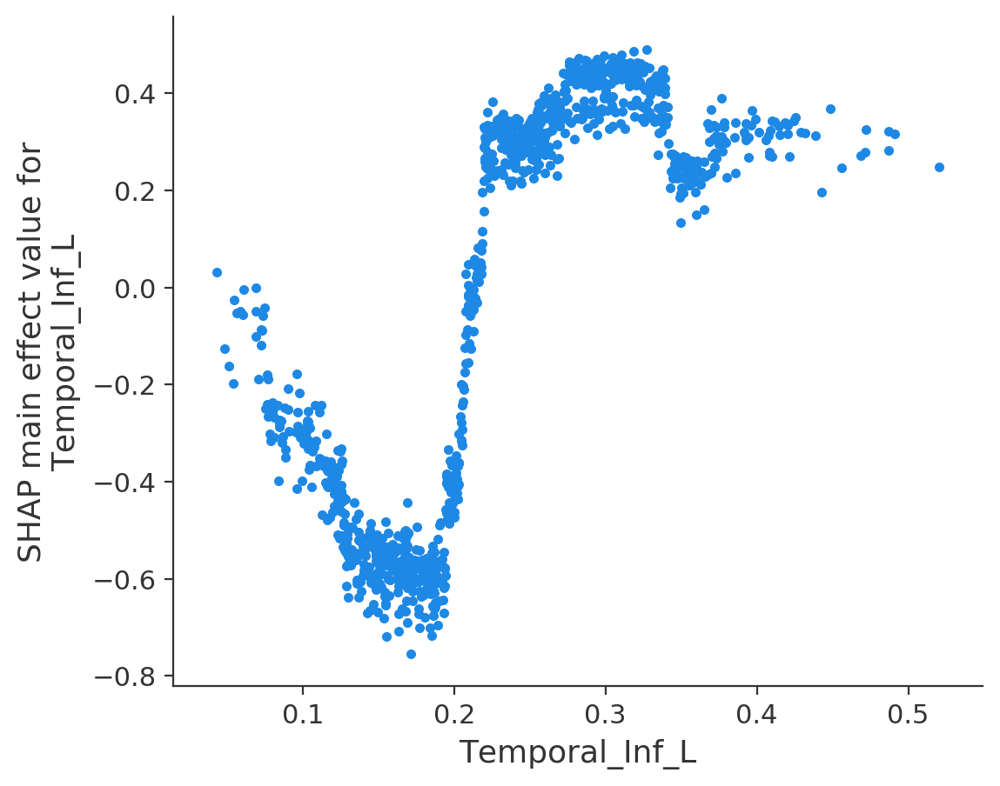

...

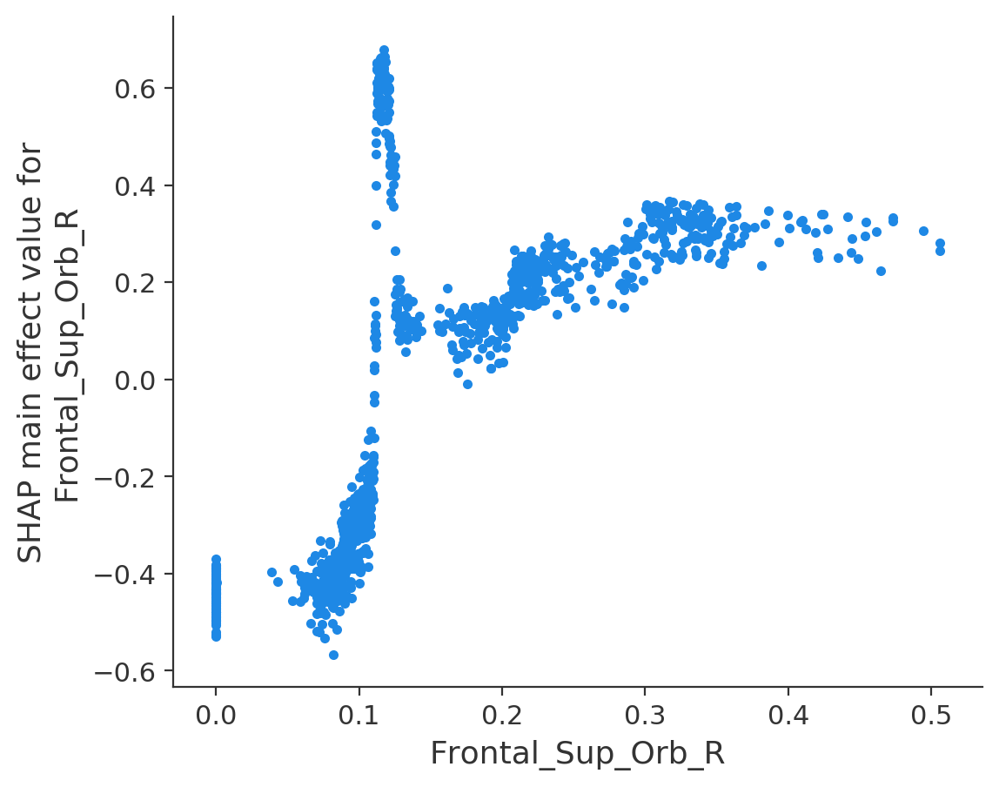

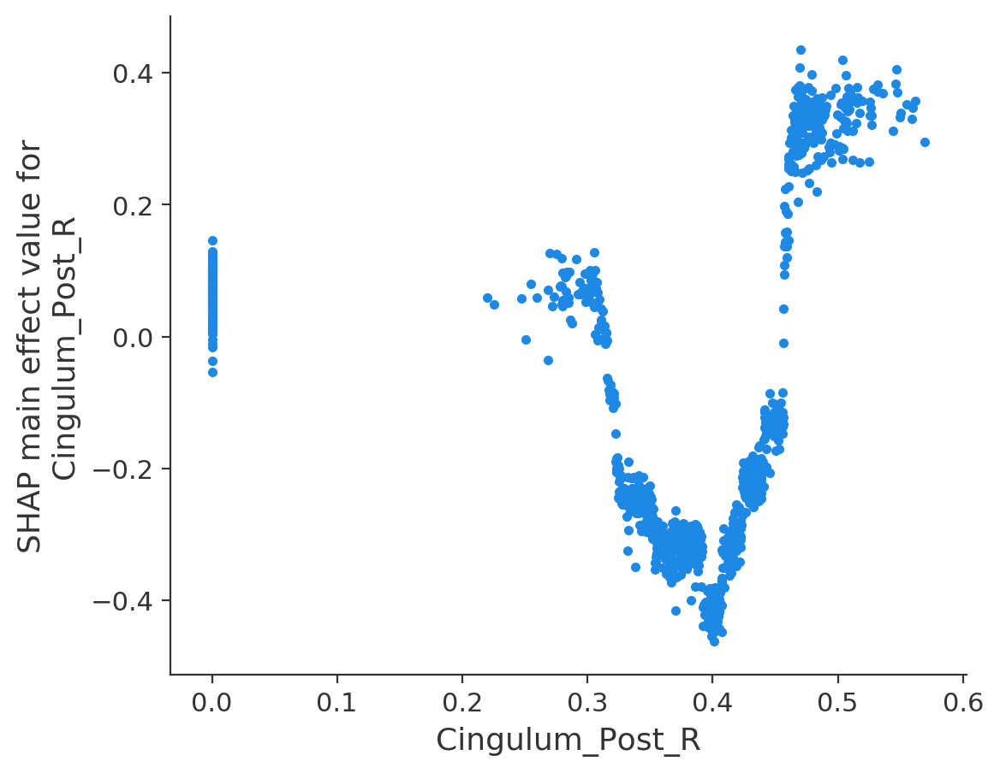

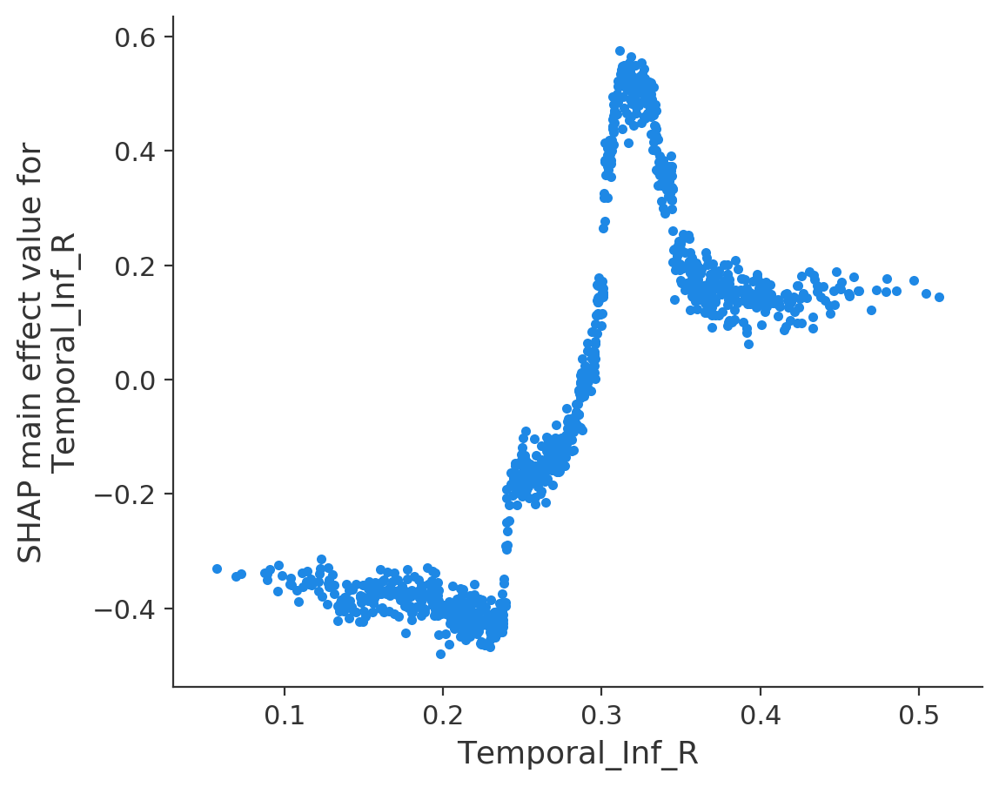

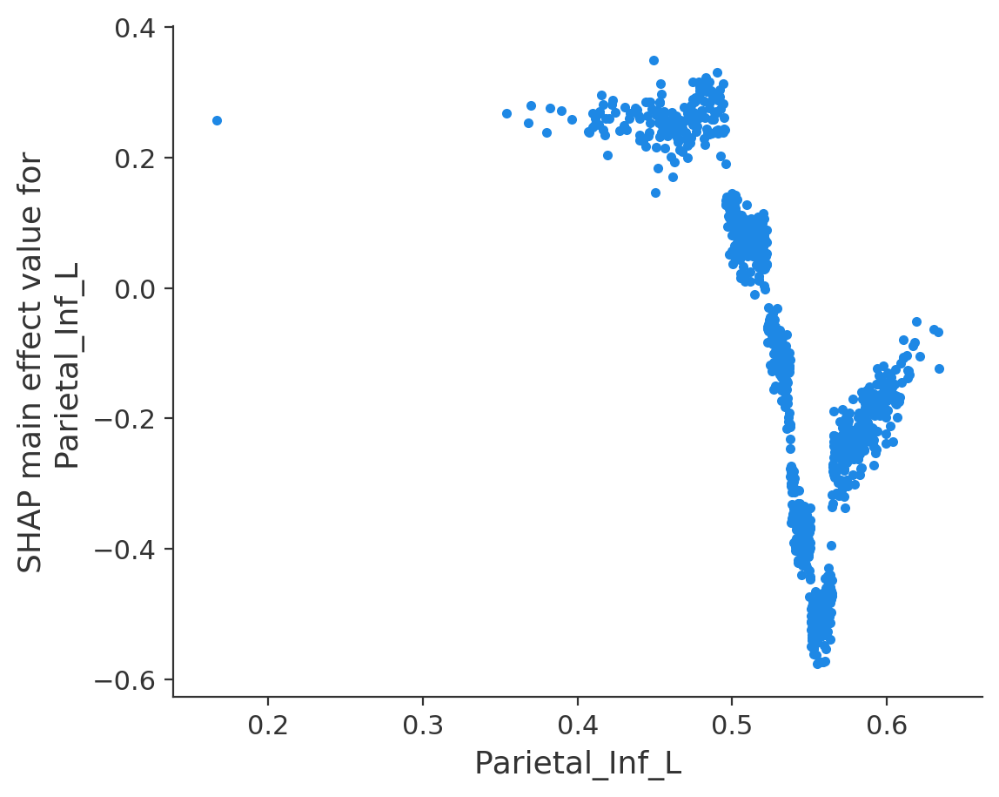

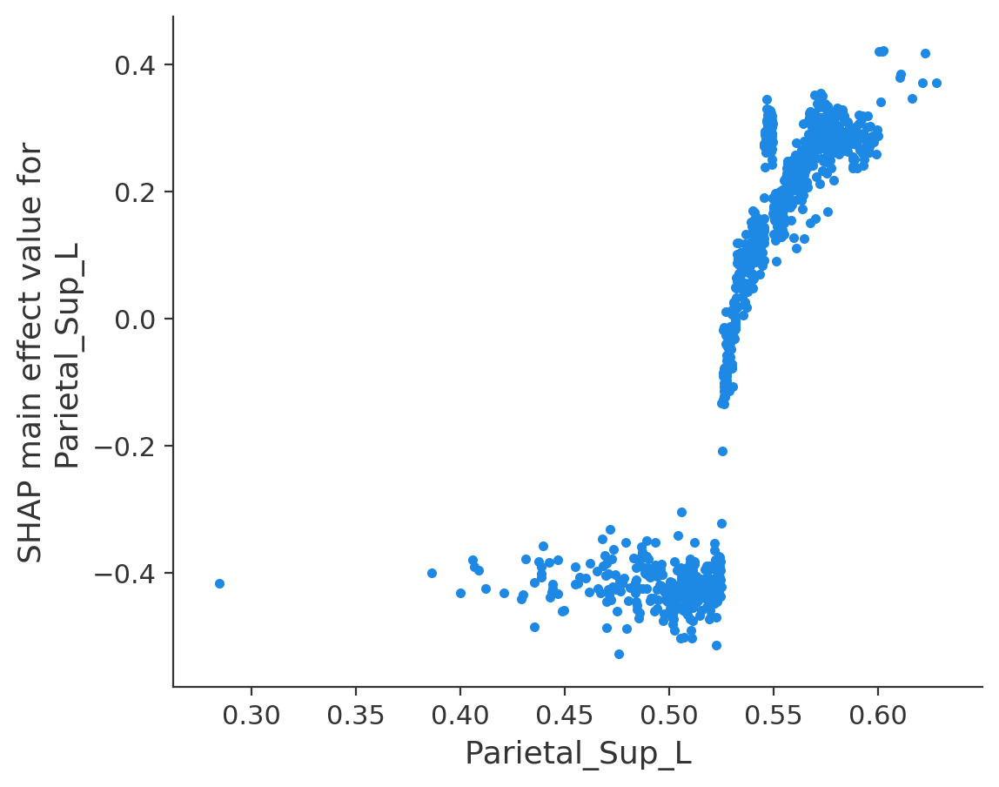

In [18]:
for i in range(20):
    shap.dependence_plot(
        (top_inds[i], top_inds[i]),
        shap_interaction_values, 
        X
    )

# SHAP interaction value plots
# top 20

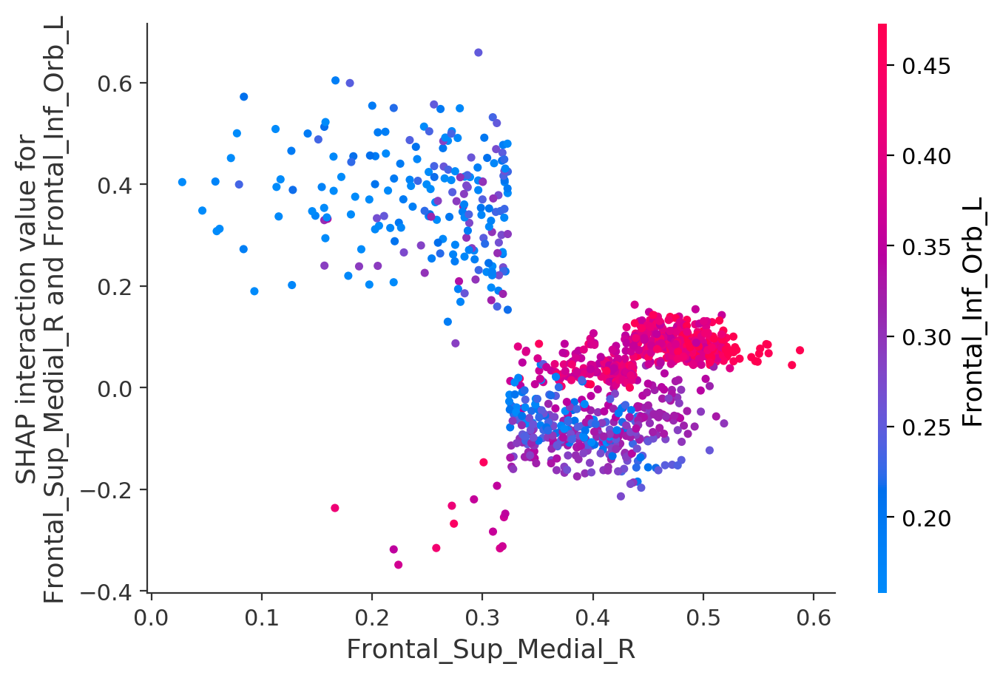

In [19]:
shap.dependence_plot(
    ('Frontal_Sup_Medial_R', 'Frontal_Inf_Orb_L'),
    shap_interaction_values, 
    X
)

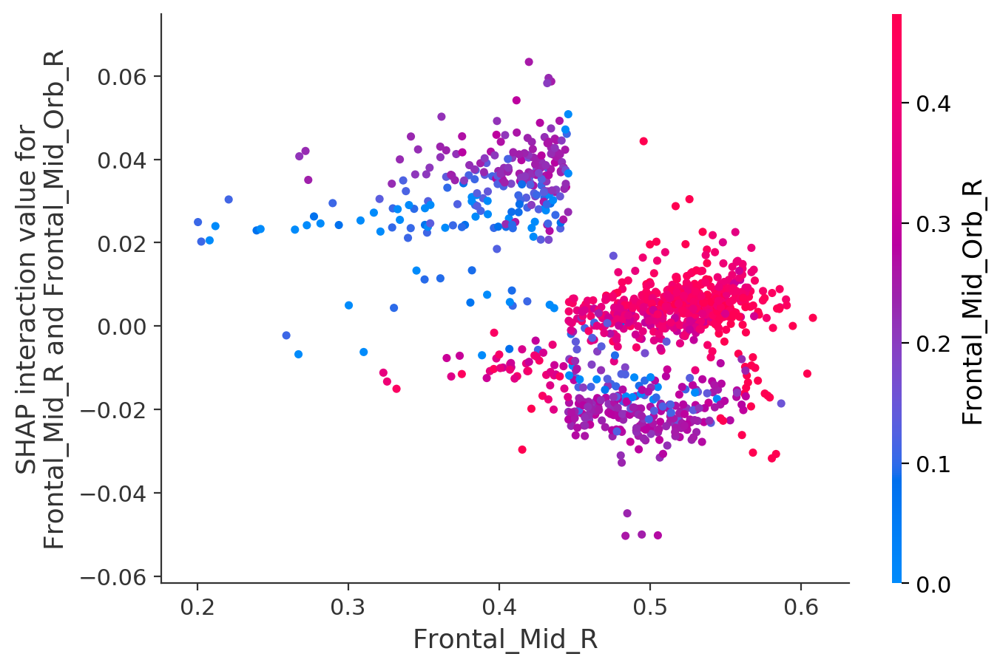

In [20]:
shap.dependence_plot(
    ('Frontal_Mid_R', 'Frontal_Mid_Orb_R'),
    shap_interaction_values, 
    X
)

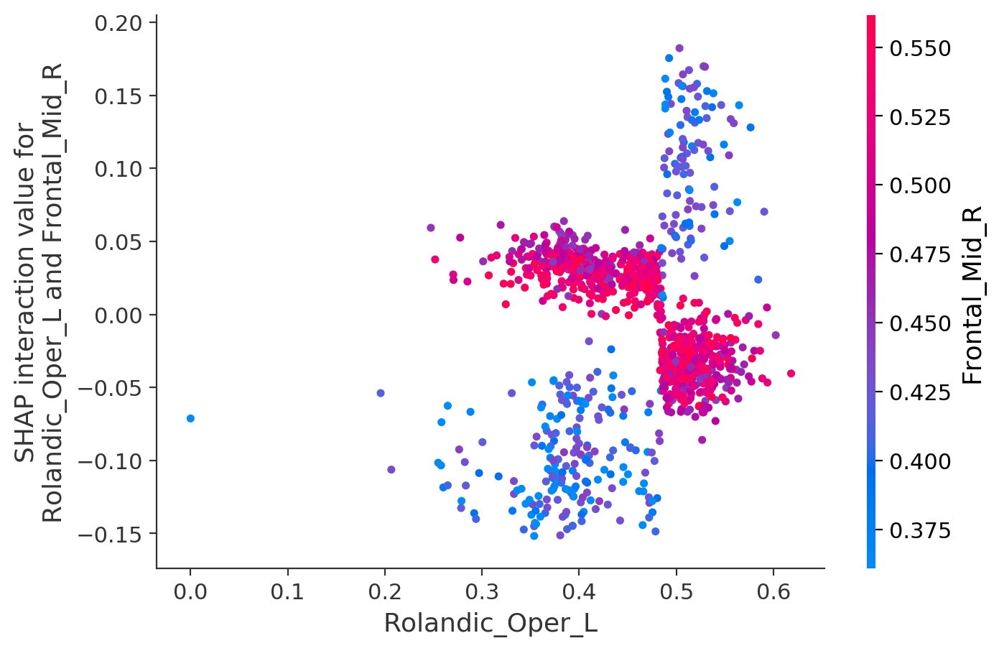

In [21]:
shap.dependence_plot(
    ('Rolandic_Oper_L', 'Frontal_Mid_R'),
    shap_interaction_values, 
    X
)

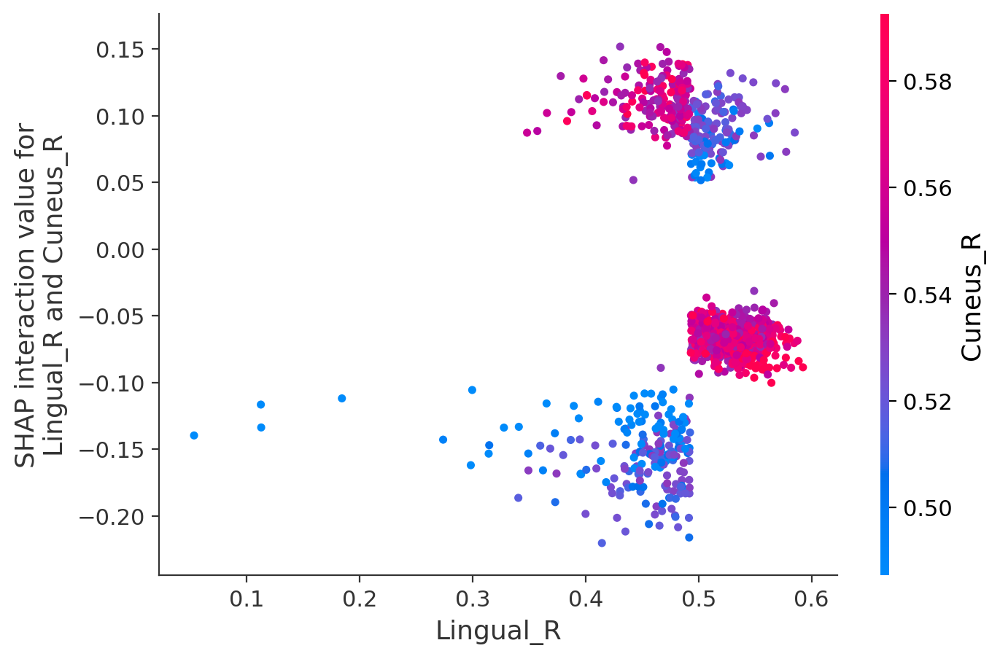

In [22]:
shap.dependence_plot(
    ('Lingual_R', 'Cuneus_R'),
    shap_interaction_values, 
    X
)

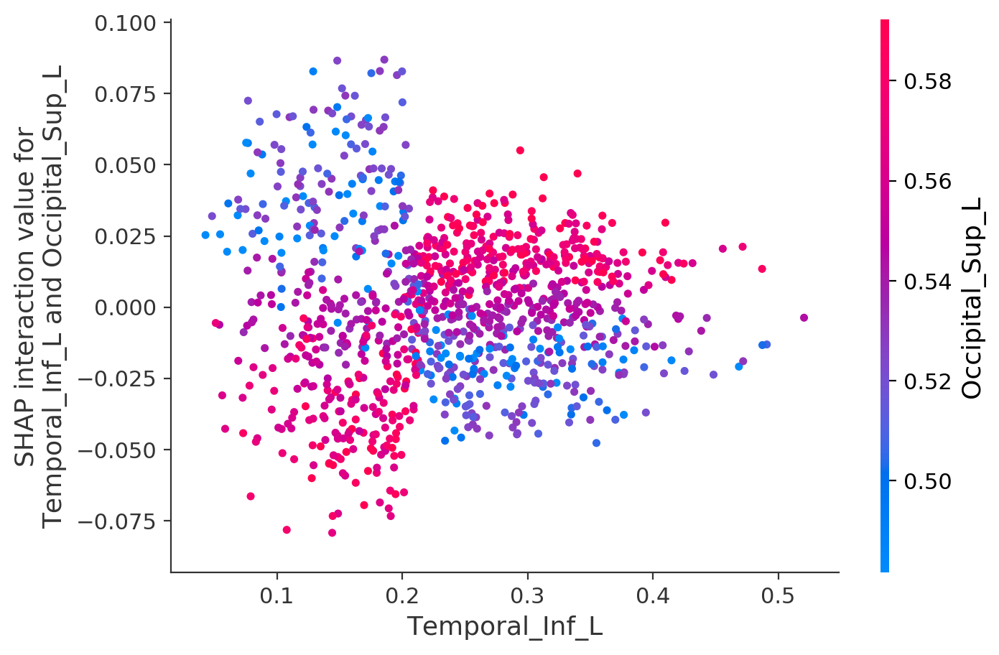

In [23]:
shap.dependence_plot(
    ('Temporal_Inf_L', 'Occipital_Sup_L'),
    shap_interaction_values, 
    X
)

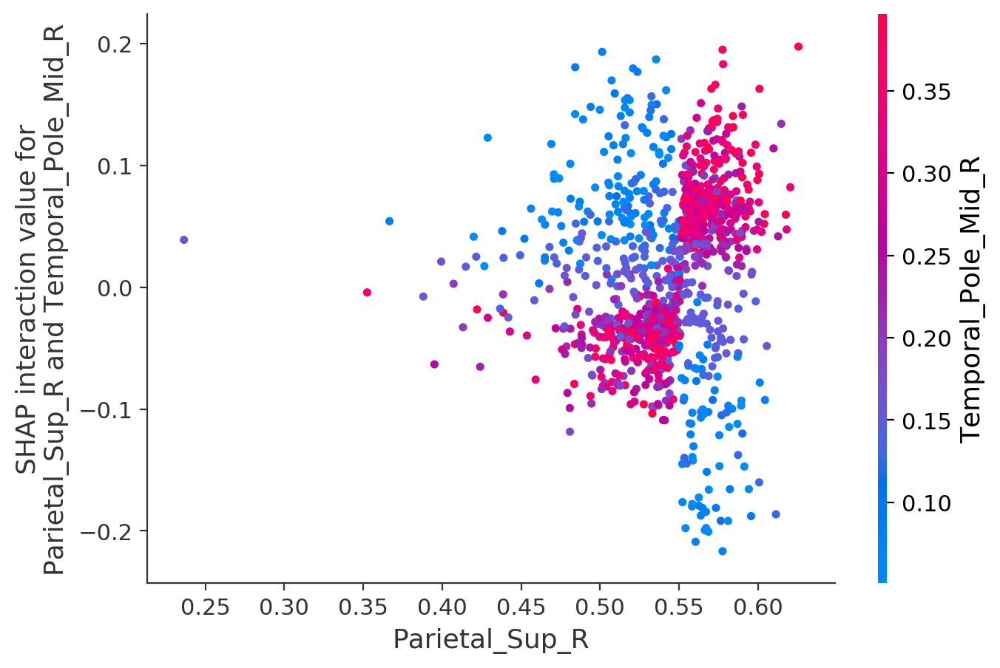

In [24]:
shap.dependence_plot(
    ('Parietal_Sup_R', 'Temporal_Pole_Mid_R'),
    shap_interaction_values, 
    X
)

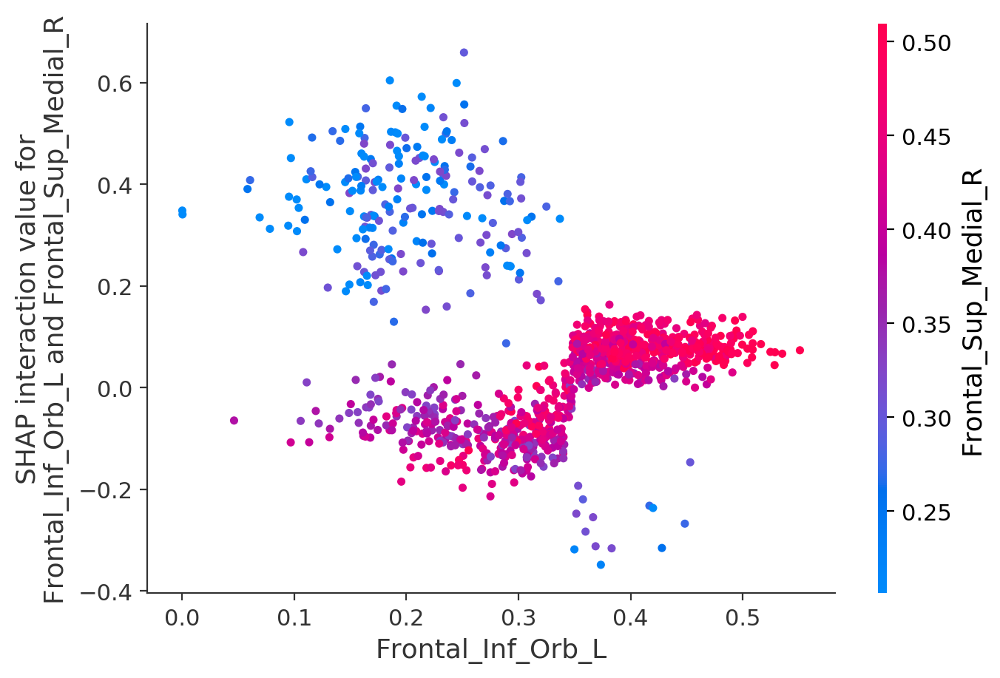

In [25]:
shap.dependence_plot(
    ('Frontal_Inf_Orb_L', 'Frontal_Sup_Medial_R'),
    shap_interaction_values, 
    X
)

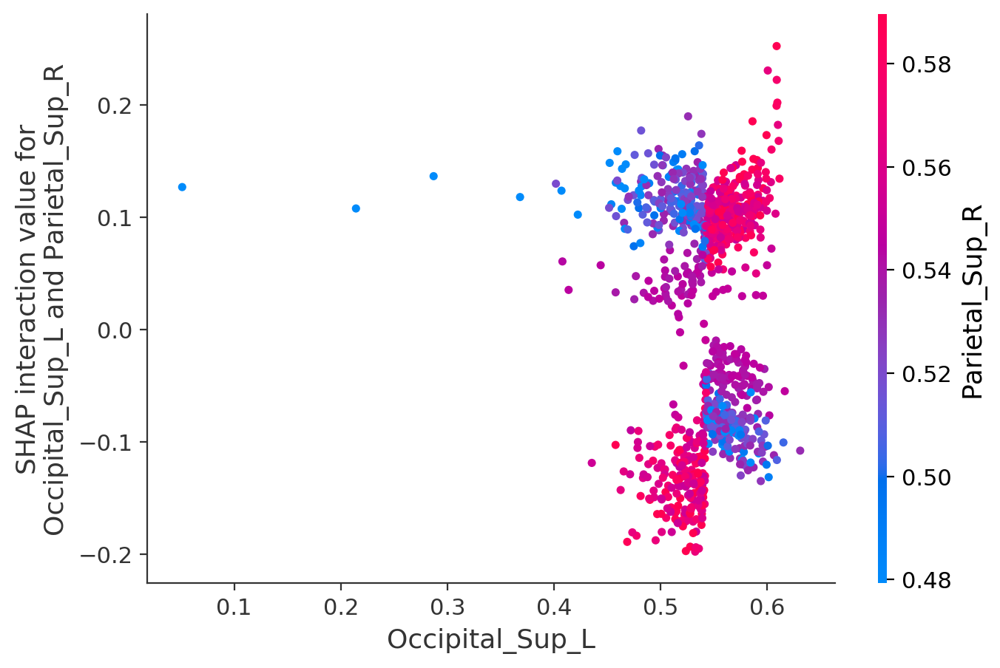

In [26]:
shap.dependence_plot(
    ('Occipital_Sup_L', 'Parietal_Sup_R'),
    shap_interaction_values, 
    X
)

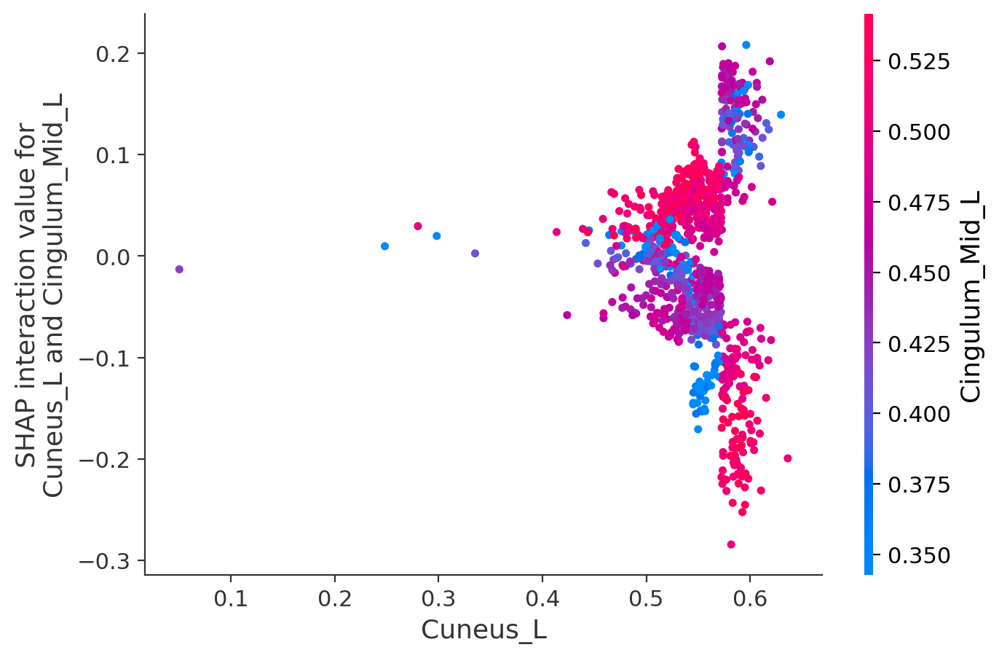

In [27]:
shap.dependence_plot(
    ('Cuneus_L', 'Cingulum_Mid_L'),
    shap_interaction_values, 
    X
)

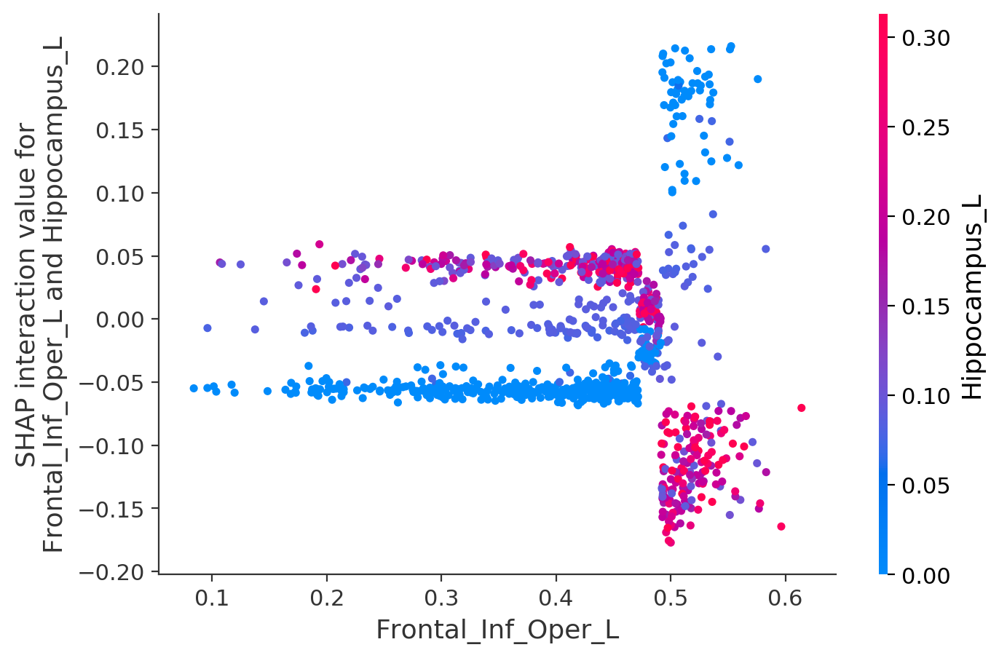

In [28]:
shap.dependence_plot(
    ('Frontal_Inf_Oper_L', 'Hippocampus_L'),
    shap_interaction_values, 
    X
)

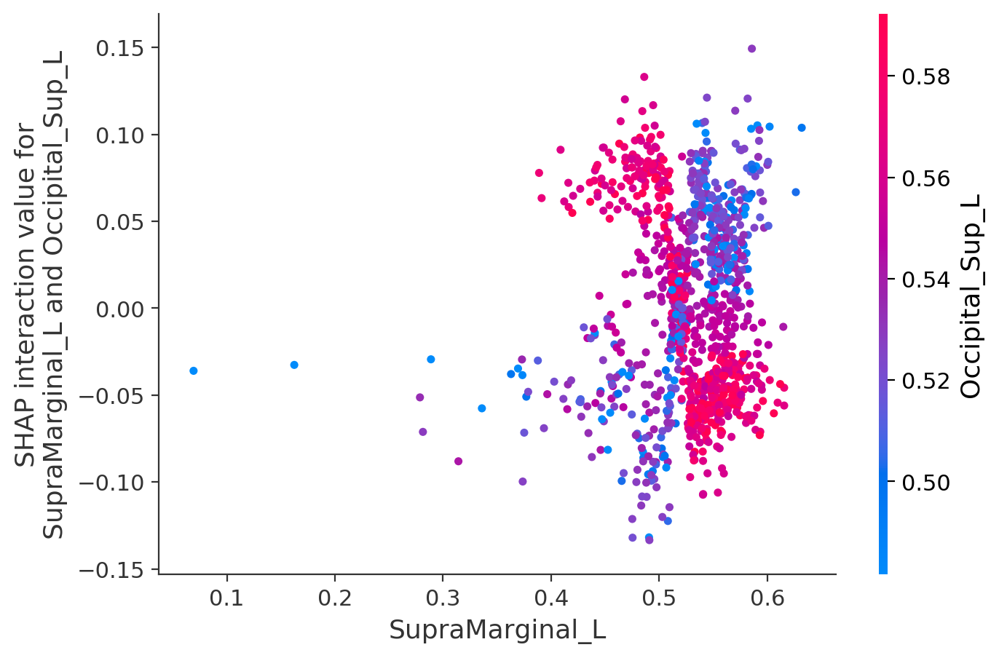

In [29]:
shap.dependence_plot(
    ('SupraMarginal_L', 'Occipital_Sup_L'),
    shap_interaction_values, 
    X
)

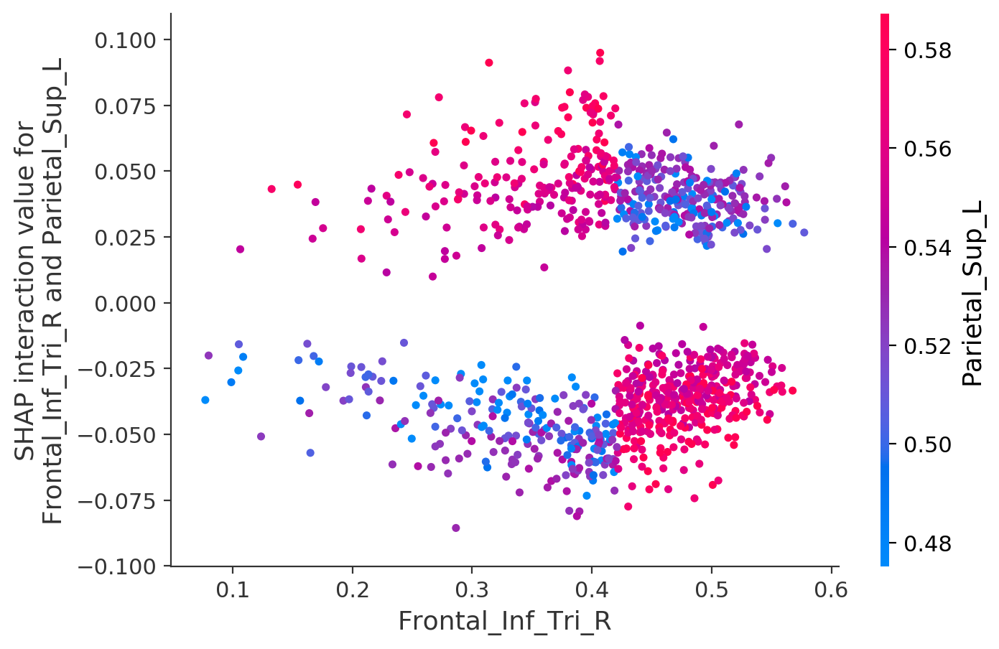

In [30]:
shap.dependence_plot(
    ('Frontal_Inf_Tri_R', 'Parietal_Sup_L'),
    shap_interaction_values, 
    X
)

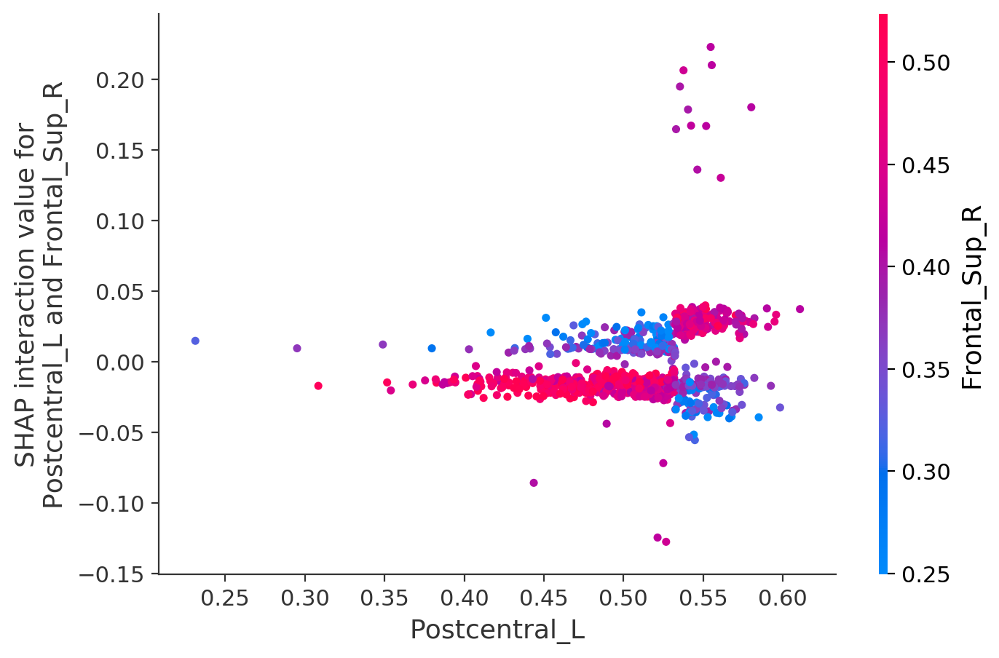

In [31]:
shap.dependence_plot(
    ('Postcentral_L', 'Frontal_Sup_R'),
    shap_interaction_values, 
    X
)

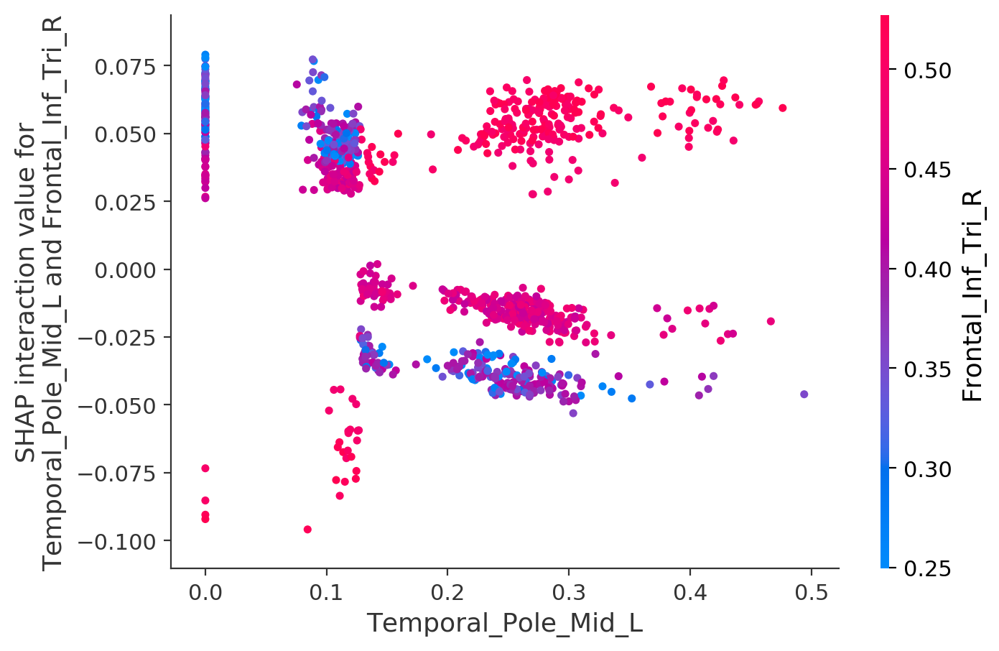

In [32]:
shap.dependence_plot(
    ('Temporal_Pole_Mid_L', 'Frontal_Inf_Tri_R'),
    shap_interaction_values, 
    X
)

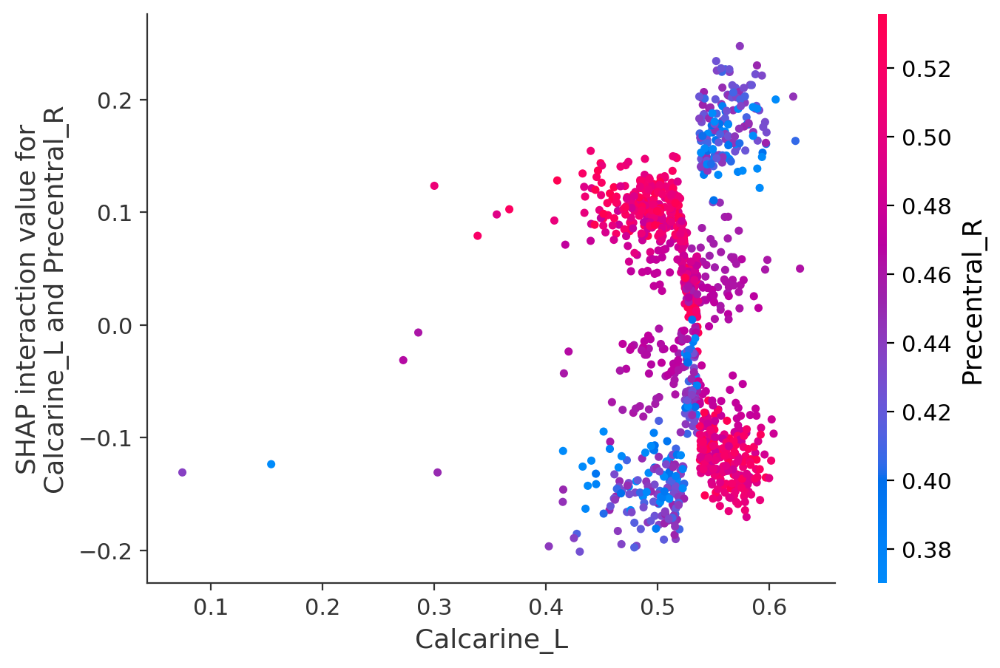

In [33]:
shap.dependence_plot(
    ('Calcarine_L', 'Precentral_R'),
    shap_interaction_values, 
    X
)

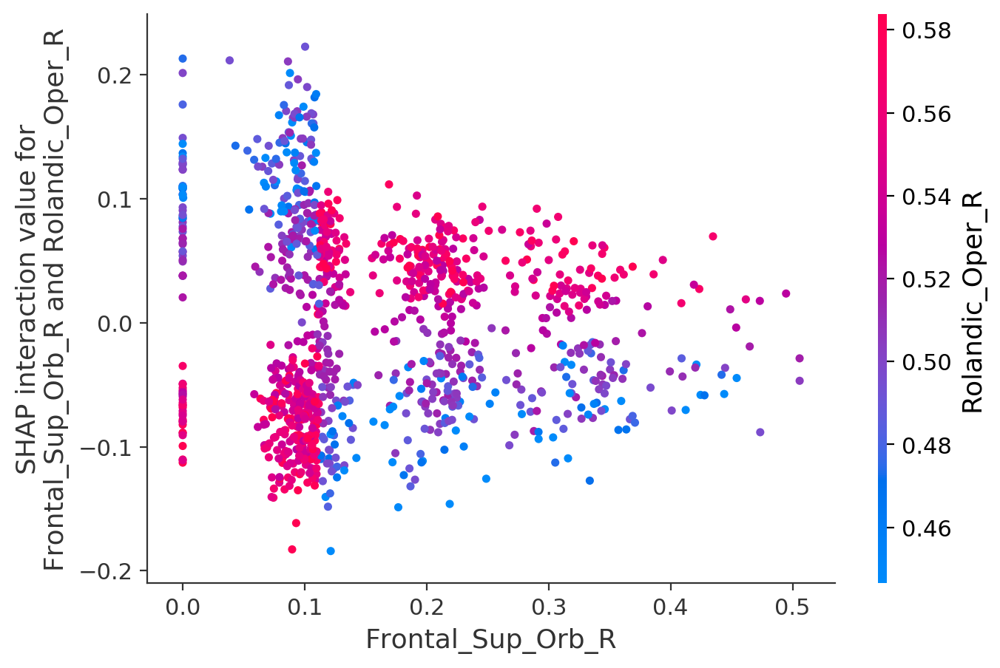

In [34]:
shap.dependence_plot(
    ('Frontal_Sup_Orb_R', 'Rolandic_Oper_R'),
    shap_interaction_values, 
    X
)

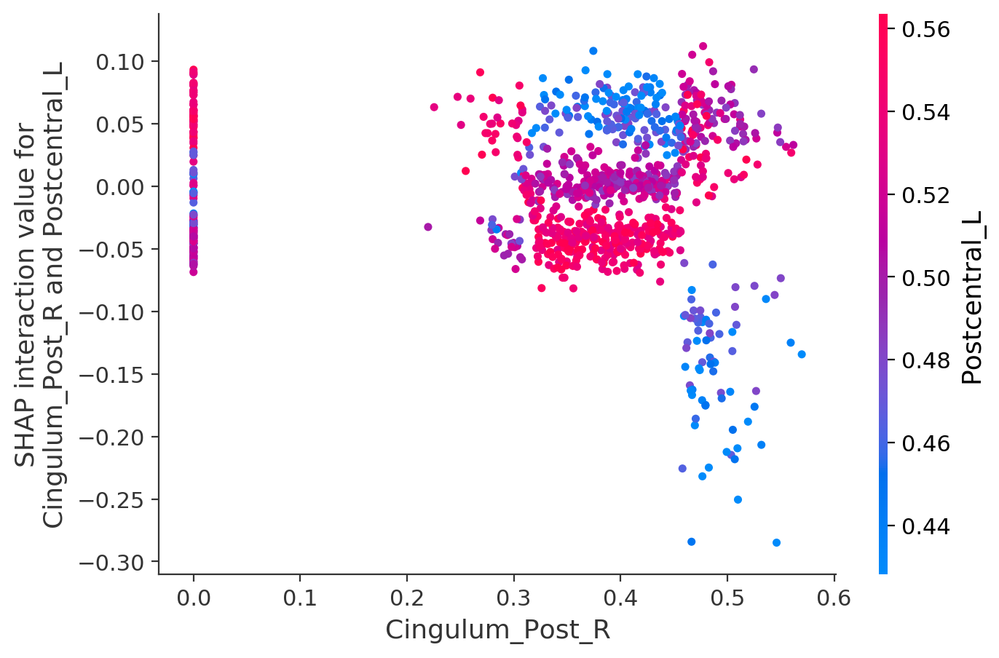

In [35]:
shap.dependence_plot(
    ('Cingulum_Post_R', 'Postcentral_L'),
    shap_interaction_values, 
    X
)

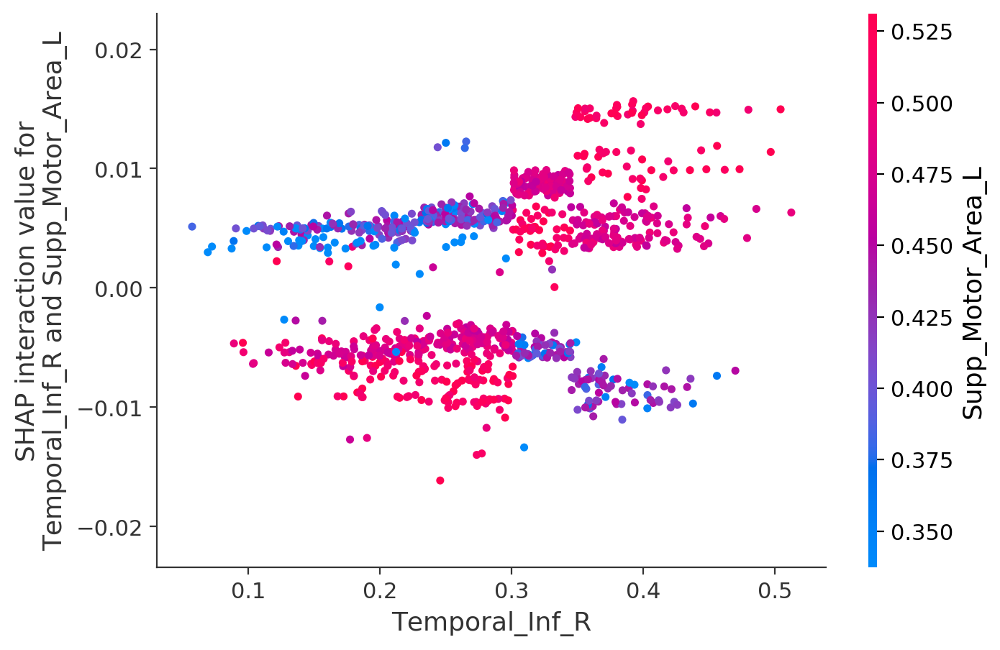

In [38]:
shap.dependence_plot(
    ('Temporal_Inf_R', 'Supp_Motor_Area_L'),
    shap_interaction_values, 
    X
)

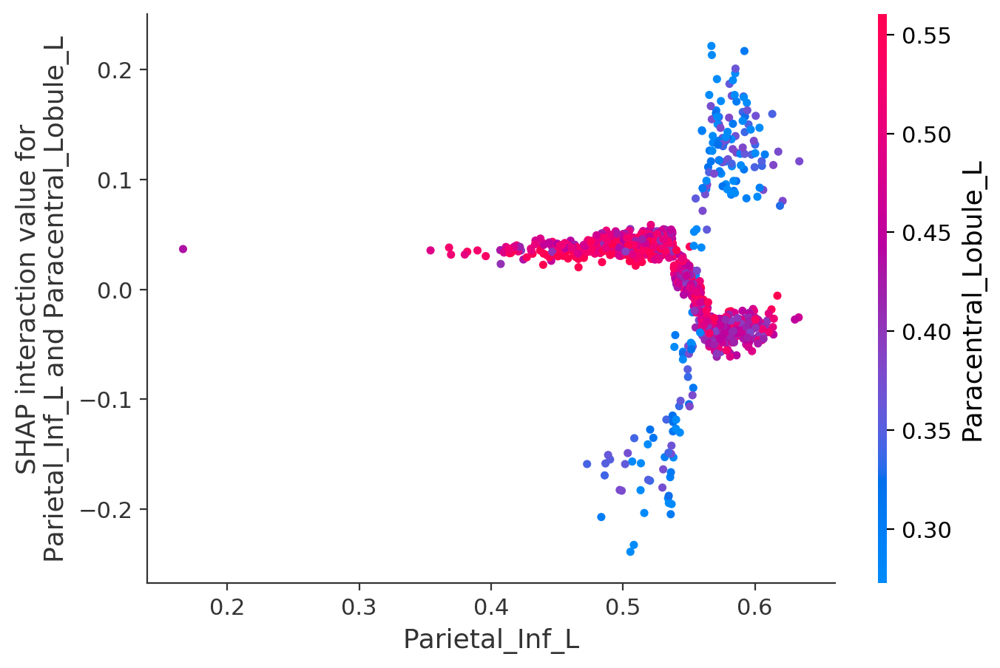

In [36]:
shap.dependence_plot(
    ('Parietal_Inf_L', 'Paracentral_Lobule_L'),
    shap_interaction_values, 
    X
)

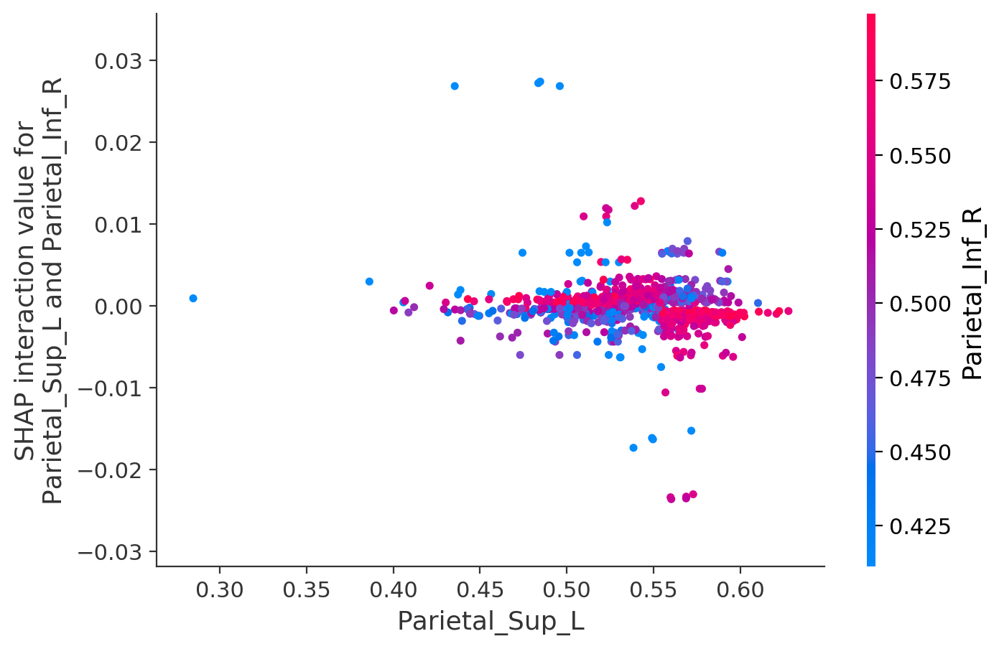

In [37]:
shap.dependence_plot(
    ('Parietal_Sup_L', 'Parietal_Inf_R'),
    shap_interaction_values, 
    X
)